# **Exploración de Datos - Monografia**
## Mateo Usme - 1017264083
## Jorge Rojas - 71690015
## Universidad de Antioquia

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import plotly.express as px

##Importación de datos y procesamiento

En el procesamiento de los datos vamos a darle formato a nuestra fecha para una mejor manera de tratarlos en un futuro

In [2]:
data_1 = pd.read_csv("https://github.com/MateoUsme/Esp_Analitica/raw/main/datos.csv",
                     sep=";",
                     index_col=False, 
                     encoding= 'unicode_escape', 
                     parse_dates=["FechaFactura"], 
                     infer_datetime_format=True)\
                     .sort_values(by=["FechaFactura"], ascending=True)\
                     .reset_index()
del data_1["index"]
data_1 = data_1.drop(data_1[data_1.Kilos <= 0].index).reset_index(drop= True)
data_1

,FechaFactura,GrupoProducto,NombrePais,NombreDepartamento,NombreCategoria,NombreDrive,NombreSubDrive,Kilos
0,2018-05-18,685325,COLOMBIA,"BOGOTÁ, D.C.",SAUCES & DRESSINGS,CUSTOM CULINARY,ZAFRÁN,117.6
1,2018-05-18,688435,COLOMBIA,"BOGOTÁ, D.C.",SAUCES & DRESSINGS,CUSTOM CULINARY,ZAFRÁN,16.0
2,2018-05-18,688435,COLOMBIA,ANTIOQUIA,SAUCES & DRESSINGS,CUSTOM CULINARY,ZAFRÁN,16.0
3,2018-05-18,688443,COLOMBIA,CESAR,SAUCES & DRESSINGS,CUSTOM CULINARY,ZAFRÁN,12.8
4,2018-05-18,688443,COLOMBIA,VALLE DEL CAUCA,SAUCES & DRESSINGS,CUSTOM CULINARY,ZAFRÁN,192.0
...,...,...,...,...,...,...,...,...
304795,2021-10-30,685063,COLOMBIA,VALLE DEL CAUCA,SAUCES & DRESSINGS,CUSTOM CULINARY,ZAFRÁN,136.0
304796,2021-10-30,685063,COLOMBIA,ANTIOQUIA,SAUCES & DRESSINGS,CUSTOM CULINARY,ZAFRÁN,23.8
304797,2021-10-30,685063,COLOMBIA,HUILA,SAUCES & DRESSINGS,CUSTOM CULINARY,ZAFRÁN,136.0
304798,2021-10-30,685398,COLOMBIA,MAGDALENA,SAUCES & DRESSINGS,CUSTOM CULINARY,ZAFRÁN,64.0


Verificamos los tipos de datos de nuestras variables esperando obtener nuestra columnas **FechaFactura** convertida en *datetime*

In [3]:
data_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 304800 entries, 0 to 304799
Data columns (total 8 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   FechaFactura        304800 non-null  datetime64[ns]
 1   GrupoProducto       304800 non-null  int64         
 2   NombrePais          304800 non-null  object        
 3   NombreDepartamento  304800 non-null  object        
 4   NombreCategoria     304800 non-null  object        
 5   NombreDrive         304800 non-null  object        
 6   NombreSubDrive      304800 non-null  object        
 7   Kilos               304800 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(1), object(5)
memory usage: 18.6+ MB


##Exploración de datos categóricos

Tenemos 9 columnas, de las cuales:

**1** es una serie de tiempo:

*   FechaFactura

**2** son numéricas:

*   GrupoProducto *(Esta columna deberá pasarse a categórica al ser realmente una etiqueta)*
*   Kilos

y **6** son categóricas:

*   NombrePais
*   NombreDepartamento
*   NombreCategoria
*   NombreDrive
*   NombreSubDrive

Solo a las categóricas y a las numéricas se le debe realizar un análisis importante en datos atípicos o faltantes puesto que la serie de tiempo **no presentó ningún error** en la conversión de formato y todas son fechas válidas.

In [4]:
#Función para tener mayor detalle de valores nulos en un DataFrame

def get_categories(df, limite=20):

    cols_disponibles = df.columns[~df.applymap(
        lambda x: isinstance(x, list)).all(axis=0)]
    columnas_descartadas = df.columns[~df.columns.isin(cols_disponibles)]
    print('Columnas multiselect:', columnas_descartadas.to_list())
    for col in columnas_descartadas:
        print(f'\nColumna {col} - Tipo Multiselct con opciones:')
        print(' | '.join(df[col].explode().dropna().unique()))
    df_unicos = df.apply(lambda s: s.explode().dropna().unique().shape).T.set_axis(
        ['unicos'], axis=1)
    df_categories = df.apply(lambda x: " | ".join(map(
        str, x.explode().dropna().unique())) if x.explode().dropna().unique().shape[0] < limite else '-', axis=0).to_frame('categorias')
    df_faltantes = df.apply(
        lambda s: s.isnull()).sum().to_frame('faltantes')
    df_conteo = df.count().to_frame('num_datos')
    df_tipo = df.dtypes.to_frame('tipo')
    df_pct = (df.isnull().mean()*100).round(1).to_frame('% faltante')
    return pd.concat([df_categories, df_unicos, df_conteo, df_faltantes, df_pct, df_tipo], axis=1)

In [5]:
get_categories(data_1, limite= 10)

Columnas multiselect: []


,categorias,unicos,num_datos,faltantes,% faltante,tipo
FechaFactura,-,1034,304800,0,0.0,datetime64[ns]
GrupoProducto,-,1011,304800,0,0.0,int64
NombrePais,COLOMBIA | PERÚ | ECUADOR | PANAMA | VENEZUELA,5,304800,0,0.0,object
NombreDepartamento,-,38,304800,0,0.0,object
NombreCategoria,-,10,304800,0,0.0,object
NombreDrive,CUSTOM CULINARY | SIN CLASIFICAR | MEAT | REPR...,6,304800,0,0.0,object
NombreSubDrive,ZAFRÁN | SIN CLASIFICAR | CHEFS OWN | GOLD LABEL,4,304800,0,0.0,object
Kilos,-,10923,304800,0,0.0,float64


Según la columna "únicos" tenemos una variable tipo *Datetime* que es **Fecha Factura**, y dos numéricas que son **Grupo Producto** y **Kilos**.

Podemos centrarnos en las categóricas que corresponden a las variables no mencionadas aún y que se observan en la tabla de arriba

### Producto por país 

In [6]:
px.histogram(data_1, x="FechaFactura", color="NombrePais")

### Producto por Departamento

In [7]:
px.histogram(data_1, x="FechaFactura", color="NombreDepartamento")

### Producto por Categoría

In [ ]:
px.histogram(data_1, x="FechaFactura", color="NombreCategoria")

### Producto por Drive

In [ ]:
px.histogram(data_1, x="FechaFactura", color="NombreDrive")

### Producto por SubDrive

In [ ]:
px.histogram(data_1, x="FechaFactura", color="NombreSubDrive")

Desde este tipo de gráficas podemos ver además a la derecha las cateorías que tenemos y si existen algunas que sean nulas pero se hayan tomado como una válida, en el caso de **Nombre Categoría** tenemos *Other products* y en el caso de los **Drives** y **SubDrives** tenemos *Sin Clasificar*. 

Además, se nota una significativa predominancia en alguno valores categóricos según la variable como lo es *Medellín* en **NombreMunicipio** o *Zafrán* en **NombreSubDrive**

Actualmente tenemos los siguientes datos analizados entre datos atípicos y nulos:

*   GrupoProducto
*   Kilos
*   ✅ NombrePais 
*   ✅ NombreDepartamento 
*   ✅ NombreMunicipio 
*   ✅ NombreCategoria
*   ✅ NombreDrive
*   ✅ NombreSubDrive

## Exploración de datos numéricos

Aún faltan las numéricas, pero **GrupoProducto** es una variable que funciona como etiqueta del producto por lo que tendremos que revisarlo como una variable categórica que tiene poco más de mil elementos únicos.

Ahora daremos un análisis a nuestra variable numérica de **Kilos**

In [8]:
data_1.describe().filter(["Kilos"])

,Kilos
count,304800.000000
mean,199.195018
std,609.248006
min,0.040000
25%,15.200000
50%,40.000000
75%,150.000000
max,42000.000000


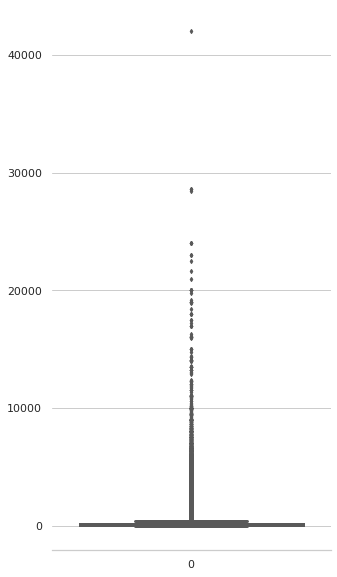

In [9]:
sns.set(rc={'figure.figsize':(5,10)}) # Tamaño de la figura
sns.set(style="whitegrid") # Estilo de la figura
sns.boxplot(data = data_1.Kilos, linewidth = 3, palette="Set2", fliersize = 3)
sns.despine(left=True)

La variable objetivo *Kilos* presenta una gran variedad de valores por encima, se esperaría que sean atípicos y no se deseen en el conjunto de datos que se utilizará para entrenar el modelo para predecir.

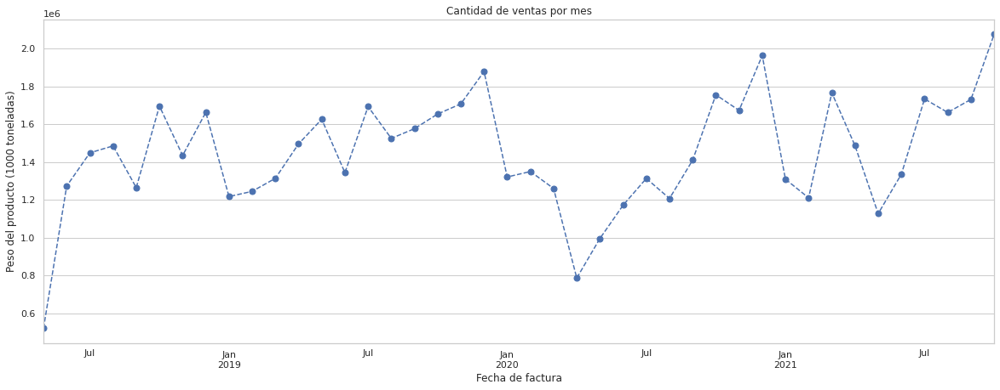

In [10]:
data_month = data_1.groupby('FechaFactura', as_index=False)["Kilos"].sum().copy()
data_month.FechaFactura = data_month.FechaFactura.dt.to_period("M")
data_month.groupby('FechaFactura')["Kilos"].sum().plot(xlabel="Fecha de factura",
                                                       ylabel="Peso del producto (1000 toneladas)",
                                                       title="Cantidad de ventas por mes",
                                                       marker="o",
                                                       figsize=(20,7),
                                                       markersize=7,
                                                       linestyle="--").grid(axis="x")

Acá observamos que realmente la variable no tiene una notable afectación por valores atípicos si lo observamos con una periodicidad mensual, precisamente siendo esta la que utilizaremos finalmente como haremos con la fecha:

In [11]:
data_1["FechaFactura"] = data_1["FechaFactura"].apply(lambda x: x.strftime("%Y%m")).astype(int)
data_1

,FechaFactura,GrupoProducto,NombrePais,NombreDepartamento,NombreCategoria,NombreDrive,NombreSubDrive,Kilos
0,201805,685325,COLOMBIA,"BOGOTÁ, D.C.",SAUCES & DRESSINGS,CUSTOM CULINARY,ZAFRÁN,117.6
1,201805,688435,COLOMBIA,"BOGOTÁ, D.C.",SAUCES & DRESSINGS,CUSTOM CULINARY,ZAFRÁN,16.0
2,201805,688435,COLOMBIA,ANTIOQUIA,SAUCES & DRESSINGS,CUSTOM CULINARY,ZAFRÁN,16.0
3,201805,688443,COLOMBIA,CESAR,SAUCES & DRESSINGS,CUSTOM CULINARY,ZAFRÁN,12.8
4,201805,688443,COLOMBIA,VALLE DEL CAUCA,SAUCES & DRESSINGS,CUSTOM CULINARY,ZAFRÁN,192.0
...,...,...,...,...,...,...,...,...
304795,202110,685063,COLOMBIA,VALLE DEL CAUCA,SAUCES & DRESSINGS,CUSTOM CULINARY,ZAFRÁN,136.0
304796,202110,685063,COLOMBIA,ANTIOQUIA,SAUCES & DRESSINGS,CUSTOM CULINARY,ZAFRÁN,23.8
304797,202110,685063,COLOMBIA,HUILA,SAUCES & DRESSINGS,CUSTOM CULINARY,ZAFRÁN,136.0
304798,202110,685398,COLOMBIA,MAGDALENA,SAUCES & DRESSINGS,CUSTOM CULINARY,ZAFRÁN,64.0


## Codificación de variables categóricas

Realizaremos codificación de variables categóricas con **One Hot Encoding** en lugar de **pd.get_dummies** pues este primer método nos asegura que cada fila tendrá por lo menos un peso de uno en cada fila siendo algo aprovechado por el modelo mismo:

In [12]:
from sklearn.preprocessing import OneHotEncoder

for col in ["NombrePais","NombreDepartamento","NombreCategoria","NombreDrive","NombreSubDrive"]:

  clases = data_1[col]

  Onehot = OneHotEncoder(handle_unknown='ignore')
  Onehot.fit(clases.values.reshape(-1, 1))

  clases_codificadas = Onehot.transform(clases.values.reshape(-1, 1)).toarray()
  name_col_cod = Onehot.get_feature_names_out([col])
  data_1 = pd.concat([data_1]+[pd.DataFrame(clases_codificadas, columns=name_col_cod)],axis=1)
  del data_1[col]

In [13]:
data_1.columns = data_1.columns.str.strip()
data_1

,FechaFactura,GrupoProducto,Kilos,NombrePais_COLOMBIA,NombrePais_ECUADOR,NombrePais_PANAMA,NombrePais_PERÚ,NombrePais_VENEZUELA,NombreDepartamento_AMAZONAS,NombreDepartamento_ANTIOQUIA,...,NombreDrive_CUSTOM CULINARY,NombreDrive_MEAT,NombreDrive_PAT,NombreDrive_REPRESENTATIONS,NombreDrive_RESALE,NombreDrive_SIN CLASIFICAR,NombreSubDrive_CHEFS OWN,NombreSubDrive_GOLD LABEL,NombreSubDrive_SIN CLASIFICAR,NombreSubDrive_ZAFRÁN
0,201805,685325,117.6,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,201805,688435,16.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,201805,688435,16.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,201805,688443,12.8,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,201805,688443,192.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
304795,202110,685063,136.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
304796,202110,685063,23.8,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
304797,202110,685063,136.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
304798,202110,685398,64.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


Este es el dataframe final listo para ser insumo del entrenamiento del modelo, este dataframe se exportó divido en partes para poder subirse a GitHub y ser utilizado en el siguiente notebook.